## **Exploratory Data Analysis and Data Cleaning**

### **Import**

In [0]:
!git clone https://github.com/someshsingh22/FlaiReddit-MIDAS
%cd FlaiReddit-MIDAS
from modules.crawler import * #for all imports
import re #for data exploration and cleaning

Cloning into 'FlaiReddit-MIDAS'...
remote: Enumerating objects: 51, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 51 (delta 16), reused 38 (delta 9), pack-reused 0
Unpacking objects: 100% (51/51), done.
/content/FlaiReddit-MIDAS


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
from collections import Counter
import string

In [0]:
import gc
import time
import warnings

#stats
from scipy import sparse
import scipy.stats as ss

#viz
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec 
import seaborn as sns
from wordcloud import WordCloud ,STOPWORDS
from PIL import Image
import matplotlib_venn as venn

#nlp
import string
import re    #for regex
import nltk
from nltk.corpus import stopwords
import spacy
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
# Tweet tokenizer does not split at apostophes which is what we want
from nltk.tokenize import TweetTokenizer   


#FeatureEngineering
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_is_fitted
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

nltk.download('stopwords')



#settings
start_time=time.time()
color = sns.color_palette()
sns.set_style("dark")
eng_stopwords = set(stopwords.words("english"))
warnings.filterwarnings("ignore")

lem = WordNetLemmatizer()
tokenizer=TweetTokenizer()

%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### **Load Data, Stats**

In [0]:
!wget https://www.kaggleusercontent.com/kf/31655789/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..npB_Xp4CN0oPNb28Ihvurw.7cYADFVvhCBgzLTZ4Qds8v8YXTs1m8mOSBJIhcgHlHkPmqSFxcNDmSHvCrCmlbT7IIr5c78k_ynUTBGO_sWrI1zAXYgINctgzhpzYB6fCzeg7sNxjkXMOQ1blNbEDcWtrrQpJ4aV67R6LfBbPMTrJ669iy_yIcDTyrZeeRMlHcZnsFgebkyobAQddWv5oeXDi_yRGjL5fsmOc_2YerZhsIvx3OSfil28NTO2Hdh8BiH4_3N5ahpF1aqpw72OcM9PsooIo60lFP7cnKMSpYq7aFpm6zo9yk_Yfc_ob4L1cqzPBifFg--Sr0YQlzZLUF0WNRiXWO1_Dzbyej7P1QMfePNJ8AeiZhmexDSWSA4Z-SZLfHGj9_7w23C-jSIrW0m9kxLbwt7rzi4RChIoxh98N6ixJzehicQ_yFJbUQdawGQrmpdJvmc2wd8hUn2WwMl33TZXYHkiNfFjLGCiNbwdSCiQ8AuT6PB8T4pCVmDttoorpYgPKOLQZIMXvKf7tDWlpSUxaI_S16p4-ZDTJsi-yWqSB7vwsAqgYduA5slIF7bQL9xfRJd4ylzF2yXtyc0Jye3_lbvO66lmRG8r5sTdELQxhUXypIteKdQ8Wk8F2rM3w4MXq_NJcu5W_MOBM4Pjf49wMmWtfKU7KbRzZngWva3X-Qnm4s20OC-yPn2MvSc.wpvqMck2Wrq0gbxxaDbUzQ/raw_data.csv
!wget https://www.kaggleusercontent.com/kf/31655789/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..VtaFbsV1hF-Khe3V3MkvDA.eLW9zRxktUKemFSQbiLIl3E_XGMtrf_4OJ-le1JDACUHlDvdhazq0NoVruoqrDb1hQvHEaXrACKH7SeoYcWWHryVowJv6G71hjbiZJjjyo9iYKpBRFrY2w0-vSWebzaIT32zopGVFf6wp0g8Ebz3ouSkJ49-NxeGJ7JT_MOd41xw0tTIG6eW1J3lA1uHbj3nDUDF9YWwu3Sx8xatX9-k2-TOHAeXgb0BFveCg-01U8QgsR-oGpiVw-bHn9l229m49vZ-DgdDtlqtEIMJQ83P-eanCx_LSgImrmZLSQ_KZ_9wg7t4-dnjg3BC3e_sxdY5UOp3D27hC03A2IsRoZy3K6AOeX-rjY-r_bnSWdbZkriusf8TCRQcAkZFqVLMlVW8NbYrIMxp_Pr8QK5M1-zr2SDi5SakNjUaOFS7CLgw4t84QLqQdZhxQvfKdJf97pJMqpVa8CMn4taGY92_8Jx3MrR5y270cAZRm7N5yjh3qthL0g2aR9zI0xfMYE5eAaRpAT6IlK6I8nCm1RURALNm3C9Wapdxz5d4AmokFxtzm13c3VcAQzP5cFw-FQIL8FiNl0RtRNGsN6G8CPMKHJwWHHhqqemP1qx7BRITO-NG2poesO_05aRTgxGB3oSXxcgwEl9J5Qv77i4w0Yj6V_G-7Q6y18iwX7dS6-mC8qSc6iw.bLALv8AD2xLJ3sT3ScgNZQ/stats.pkl
raw_df=pd.read_csv(open('raw_data.csv'), encoding='utf-8').dropna() #Replace with data/raw_data.csv in offline mode
with open("stats.pkl",'rb') as f: #Replace with data/stats.pkl in offline mode
  x=pickle.load(f)
  post_count,post_date = [post[1] for post in x],[post[0] for post in x]

--2020-04-11 18:11:21--  https://www.kaggleusercontent.com/kf/31655789/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..npB_Xp4CN0oPNb28Ihvurw.7cYADFVvhCBgzLTZ4Qds8v8YXTs1m8mOSBJIhcgHlHkPmqSFxcNDmSHvCrCmlbT7IIr5c78k_ynUTBGO_sWrI1zAXYgINctgzhpzYB6fCzeg7sNxjkXMOQ1blNbEDcWtrrQpJ4aV67R6LfBbPMTrJ669iy_yIcDTyrZeeRMlHcZnsFgebkyobAQddWv5oeXDi_yRGjL5fsmOc_2YerZhsIvx3OSfil28NTO2Hdh8BiH4_3N5ahpF1aqpw72OcM9PsooIo60lFP7cnKMSpYq7aFpm6zo9yk_Yfc_ob4L1cqzPBifFg--Sr0YQlzZLUF0WNRiXWO1_Dzbyej7P1QMfePNJ8AeiZhmexDSWSA4Z-SZLfHGj9_7w23C-jSIrW0m9kxLbwt7rzi4RChIoxh98N6ixJzehicQ_yFJbUQdawGQrmpdJvmc2wd8hUn2WwMl33TZXYHkiNfFjLGCiNbwdSCiQ8AuT6PB8T4pCVmDttoorpYgPKOLQZIMXvKf7tDWlpSUxaI_S16p4-ZDTJsi-yWqSB7vwsAqgYduA5slIF7bQL9xfRJd4ylzF2yXtyc0Jye3_lbvO66lmRG8r5sTdELQxhUXypIteKdQ8Wk8F2rM3w4MXq_NJcu5W_MOBM4Pjf49wMmWtfKU7KbRzZngWva3X-Qnm4s20OC-yPn2MvSc.wpvqMck2Wrq0gbxxaDbUzQ/raw_data.csv
Resolving www.kaggleusercontent.com (www.kaggleusercontent.com)... 35.190.26.106
Connecting to www.kaggleusercontent.com (www.kaggleuserc

#### ***Reddit Daily Activity***
Let's plot datewise posts on r/india and compare with the plots available on subredditstats Daily Activity on r/india can be viewed at : [subredditstats](https://subredditstats.com/r/india)


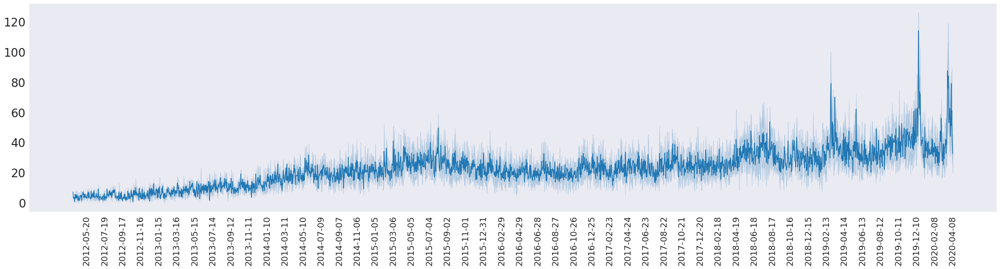

In [0]:
#@title
plt.figure(figsize=(36,8))
plt.xticks(fontsize=18,rotation=90)
plt.yticks(fontsize=24,rotation=0)
g=sns.lineplot(y=post_count, x=post_date)
g.set(xticks=post_date[::120])
plt.show()

#### ***Reddit Weekly Activity***
On visualizing weekly activity, its uniformity is confirmed.

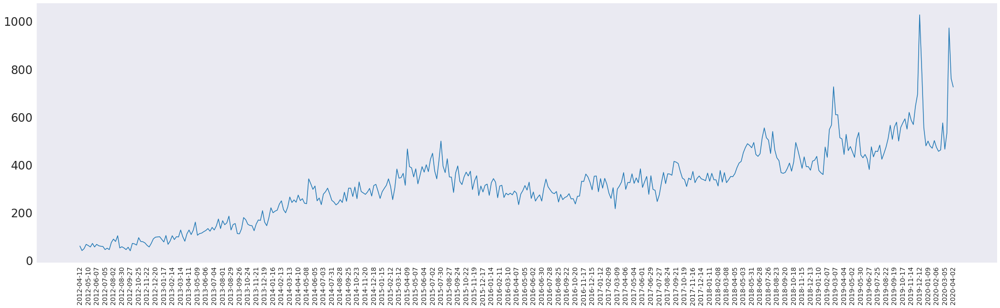

In [0]:
#@title
n=14
chunks_count = [post_count[i * n:(i + 1) * n] for i in range((len(post_count) + n - 1) // n )]
chunks_date = [post_date[i * n:(i + 1) * n] for i in range((len(post_date) + n - 1) // n )]
chunks_count=[sum(chunk) for chunk in chunks_count]
chunks_date=[chunk[-1] for chunk in chunks_date]

plt.figure(figsize=(36,10))
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=24,rotation=0)
g=sns.lineplot(x=chunks_date[:-1], y=chunks_count[:-1])
g.set(xticks=chunks_date[:-1][::4])
plt.show()

#### ***Class Distribution***
The Data has been scraped across 8 years and it is visible only some of the flairs have been persistent and have not been deleted by the moderators or admins, due to lack of training data we will build our classifier on the flairs that have atleast 1000 samples after merging similar flairs and removinf deleted or removed content

In [0]:
counter=Counter(raw_df['Flair'])
flair, freq = [],[]
for k,v in counter.items():
  flair.append(k)
  freq.append(v)
print(counter)

Counter({'Non-Political': 35681, 'AskIndia': 33888, 'Politics': 13411, '[R]eddiquette': 5086, 'Scheduled': 1658, 'Policy/Economy': 1517, 'Science/Technology': 1402, 'Business/Finance': 1167, 'Coronavirus': 957, 'Demonetization': 756, 'Food': 587, 'Sports': 561, 'Net Neutrality': 438, 'Technology': 386, 'Policy': 353, 'Entertainment': 335, 'Science &amp; Technology': 253, 'AMA': 230, 'Photography': 135, 'Unverified': 128, 'CAA-NRC': 114, 'Askindia': 97, 'Moderated': 95, 'Casual': 73, 'Policy &amp; Economy': 55, 'Business &amp; Finance': 37, 'Misleading': 26, 'Governance': 24, 'Reddiquette Enforced': 24, 'Casual AMA': 22, 'Low-effort self-post.': 14, 'AMA Announcement': 5, '[Unverified]': 3, '[NSFNRI]': 3, 'Meta': 2, 'CAA-NRC-NPR': 2, 'Announcement': 2, 'Low-effort Self Post.': 2, 'Unverified Content.': 2, 'Megathread': 2, 'Cultural Exchange': 2, 'Repost.': 2, 'ಠ_ಠ': 2, 'Removed: Low-effort self-post': 2, '( ͡° ͜ʖ ͡°)': 2, '[OLD]': 2, '[Important!]': 2, 'Verified': 1, 'PARTAYYY AGAIN :D'

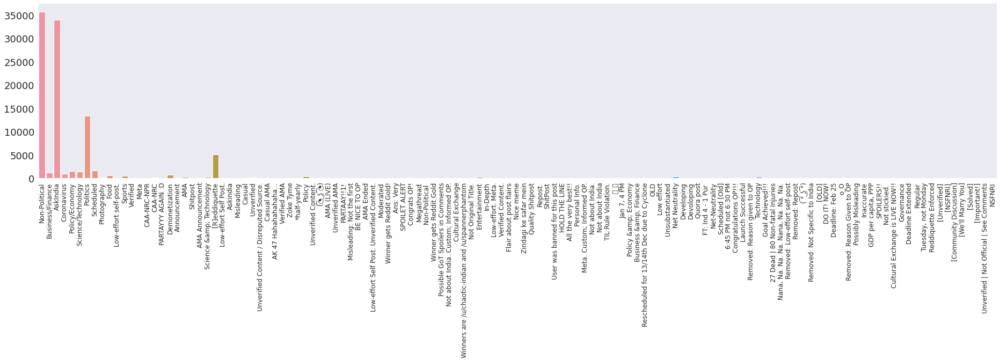

In [0]:
#@title
raw_df=raw_df[raw_df['Text'].apply(lambda x : x.count('[removed]')) == 0]
raw_df['Flair'].replace('Science &amp; Technology', 'Science/Technology', inplace=True)
raw_df['Flair'].replace('Policy &amp; Economy', 'Policy/Econonmy', inplace=True)
raw_df['Flair'].replace('Non-Political ', 'Non-Political', inplace=True)
raw_df['Flair'].replace('Askindia', 'AskIndia', inplace=True)
plt.figure(figsize=(32,6))
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=18,rotation=0)
sns.barplot(x=flair, y=freq)
raw_df=raw_df[raw_df['Flair'].apply(lambda x : counter[x])>1000]

### ***Character Composition***
Considering the character composition we can see that there are a few posts in languages other than hindi and a few emojis as well, moreover ~82% of the data is only english characters, we also have different forms such as (bold) text, and italics.

We will remove the punctuations and numbers as well but we need to make sure we do not lose morphological significance

In [0]:
corpus=' '.join(raw_df['Text']).lower()
chars=Counter(corpus)
sorted(chars.items(), key=lambda i: i[1], reverse=True)
sum=0
for i in string.ascii_letters+string.punctuation+string.digits:
  sum+=chars[i]
print(100*sum/len(' '.join(raw_df['Text'])))

82.3585841392242


In [0]:
print(chars)

Counter({' ': 10450721, 'e': 5531998, 't': 4387276, 'a': 4115376, 'i': 3898297, 'o': 3741678, 'n': 3463620, 's': 3159237, 'r': 2773058, 'h': 2327542, 'l': 1946264, 'd': 1901306, 'c': 1442313, 'm': 1413850, 'u': 1395121, 'p': 1132810, 'g': 1065663, 'w': 1025221, 'y': 1015178, 'f': 956266, 'b': 779720, '.': 726990, '\n': 594700, 'v': 554609, 'k': 486319, ',': 381631, '-': 294341, '/': 293631, "'": 163466, '0': 141168, 'j': 128208, '1': 119703, '*': 118378, '?': 111889, '2': 108173, 'x': 104424, ':': 102936, ')': 99192, '(': 92227, '3': 61391, '_': 60725, '5': 59318, 'q': 53464, '4': 53286, ';': 53178, 'z': 45121, '9': 44749, '6': 42759, '"': 42534, '8': 41075, '&': 39468, '7': 39409, ']': 35814, '[': 35798, '=': 31390, '!': 27335, '’': 18696, '#': 15277, '%': 14769, '|': 13176, 'ा': 9238, '+': 9180, '\\': 8311, 'े': 6385, 'क': 6221, 'र': 5996, '^': 5301, '“': 5205, '”': 5182, 'ह': 4345, 'न': 4241, 'ी': 4070, '्': 4007, '\xa0': 3737, 'स': 3697, 'त': 3579, 'म': 3534, 'ं': 3403, 'ि': 3330, 

### ***Contractions and Domain Specific Text in data***
* We capture major contractions using regex, and then we club them on basis of thier suffixes and create a custom map and remove other contractions by removing the apostrophes for rare cases
* Since the data is from Reddit there are mentions of subreddits \[r/\] and users \[u/\], which otherwise would be lost in the cleaning
* There are a lot of hyperlinks in the data, most hyperlinks have their context linked as \[context\]link
* Hashtags and markdown formats like &gt for > are present

In [0]:
contractions=Counter(re.findall("[a-z]+'[a-z]+", corpus))
print(sorted(contractions.items(), key=lambda i: i[1], reverse=True))
contractions=Counter(re.findall("[a-z]'[a-z]+", corpus))
print(sorted(contractions.items(), key=lambda i: i[1], reverse=True))
print(Counter(re.findall("r\/[a-z]+", corpus)).most_common(10))
print(Counter(re.findall("u\/[a-z]+", corpus)).most_common(10))
print(re.findall('\(*http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))*', corpus)[:10])
print(sorted(Counter(re.findall("#[a-z]+",corpus)).items(), key=lambda i: i[1], reverse=True)[:10])
print(Counter(re.findall("&[a-z;]+",corpus)).most_common(10))

[("don't", 20568), ("i'm", 20482), ("it's", 12730), ("i've", 7985), ("can't", 5925), ("didn't", 4976), ("doesn't", 4792), ("that's", 3273), ("i'll", 2947), ("isn't", 2859), ("i'd", 2590), ("won't", 2525), ("there's", 2359), ("what's", 2290), ("it'll", 2085), ("haven't", 1821), ("couldn't", 1814), ("let's", 1679), ("india's", 1608), ("you're", 1576), ("here's", 1463), ("wasn't", 1392), ("he's", 1370), ("they're", 1363), ("aren't", 1331), ("we're", 1121), ("wouldn't", 1089), ("shouldn't", 948), ("she's", 805), ("you'll", 593), ("hasn't", 570), ("we've", 518), ("who's", 511), ("modi's", 475), ("they've", 462), ("you've", 451), ("people's", 426), ("they'll", 396), ("today's", 378), ("we'll", 364), ("week's", 336), ("you'd", 330), ("weren't", 286), ("one's", 283), ("friend's", 257), ("world's", 248), ("father's", 246), ("government's", 228), ("country's", 216), ("dad's", 215), ("women's", 215), ("it'd", 208), ("he'll", 200), ("bjp's", 198), ("mother's", 188), ("hadn't", 186), ("how's", 179)

### ***Data Cleaning***
* We will also remove very long texts for models which need fixed length of sequences while not losing more than 5-6 % of data
* A lot of texts were simple whitespaces / links which provide no context for training therefore we will remove samples with text less than 4 words

In [0]:
contracts={
  "n't" : " not",
  "'ll" : "will",
  "'ve" : "have",
  "'n" : "",
  "'ed" : "",
  "'l" : "will",
  "'re" : "are",
  "'r" : "are",
  "'a" : " is a",
  "'d" : "had",
  "'ing" : "ing",
  "r\/" : " subreddit ",
  "u\/" : " user ",
  "&amp;" : " and ",
  "&gt;" : " greater ",
  "&lt;" : " less ",
  "&gt" : " greater ",
  "&lt" : "less",
  "#" : "#  ",}
def clean(text):
  text=text.lower()
  text=text.replace('\n', ' ')
  for k,v in contracts.items():
    text=text.replace(k,v)
  text=re.sub('[(]?http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])/)*', ' ', text)
  text=re.sub('[^a-z]', ' ', text)
  text=' '.join([word for word in text.split(' ') if not word== ''])
  return text
raw_df['Text']=raw_df['Text'].apply(lambda x : clean(x))

* We drop text less than 4 words and all lengths greater than 500 as we can see the graph tip at 500 and fall drastically with loss of less than 0.1% data

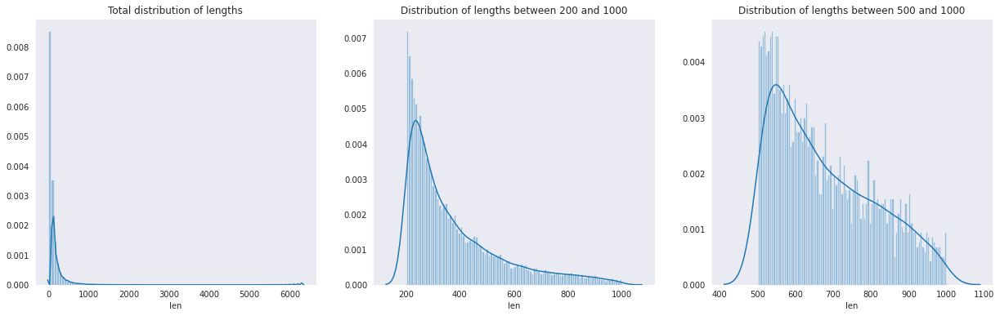

In [0]:
raw_df['len']=raw_df['Text'].str.split(' ').apply(lambda x : len(x))
plt.figure(figsize=(21,6))
plt.subplot(131)
plt.title("Total distribution of lengths")
sns.distplot(raw_df['len'], bins=100)
plt.subplot(132)
plt.title("Distribution of lengths between 200 and 1000")
sns.distplot(raw_df[raw_df['len'].apply(lambda x : (x<1000 and x>200))]['len'], bins=100)
plt.subplot(133)
plt.title("Distribution of lengths between 500 and 1000")
sns.distplot(raw_df[raw_df['len'].apply(lambda x : (x<1000 and x>500))]['len'], bins=100)

In [0]:
raw_df['len']=raw_df['Text'].str.split().apply(lambda x : len(x))
raw_df=raw_df[raw_df['len']<500]
raw_df=raw_df[raw_df['len']>2]

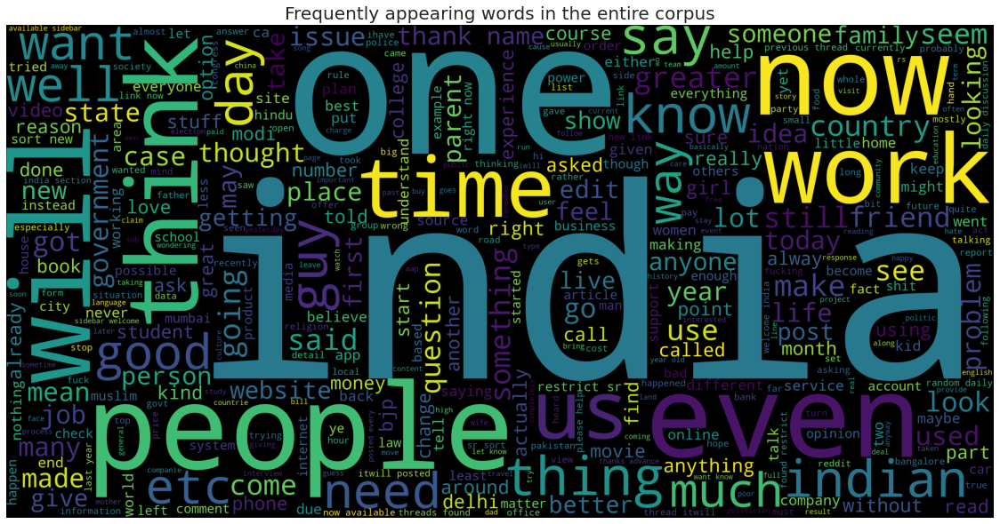

In [0]:
text=raw_df.Text.values
plt.figure( figsize=(16,8))
plt.title("Frequently appearing words in the entire corpus", fontsize=20)
wc= WordCloud(background_color="black",max_words=400,stopwords=STOPWORDS, width=3200, height=1600)
wc.generate(" ".join(text))
plt.imshow(wc)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

### ***Final distribution of Flairs***

In [0]:
del raw_df['len']
raw_df.to_csv("data/data.csv",index=False)
del raw_df
df=pd.read_csv("data/data.csv")

Counter({'Non-Political': 33396, 'AskIndia': 33169, 'Politics': 12250, '[R]eddiquette': 4721, 'Science/Technology': 1539, 'Scheduled': 1533, 'Policy/Economy': 1297, 'Business/Finance': 1090})


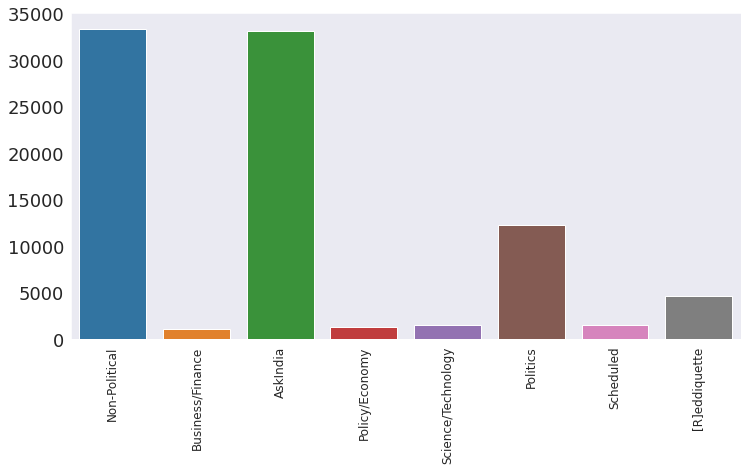

In [0]:
counter=Counter(df['Flair'])
flair, freq = [],[]
for k,v in counter.items():
  flair.append(k)
  freq.append(v)
print(counter)
plt.figure(figsize=(12,6))
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=18,rotation=0)
sns.barplot(x=flair, y=freq)

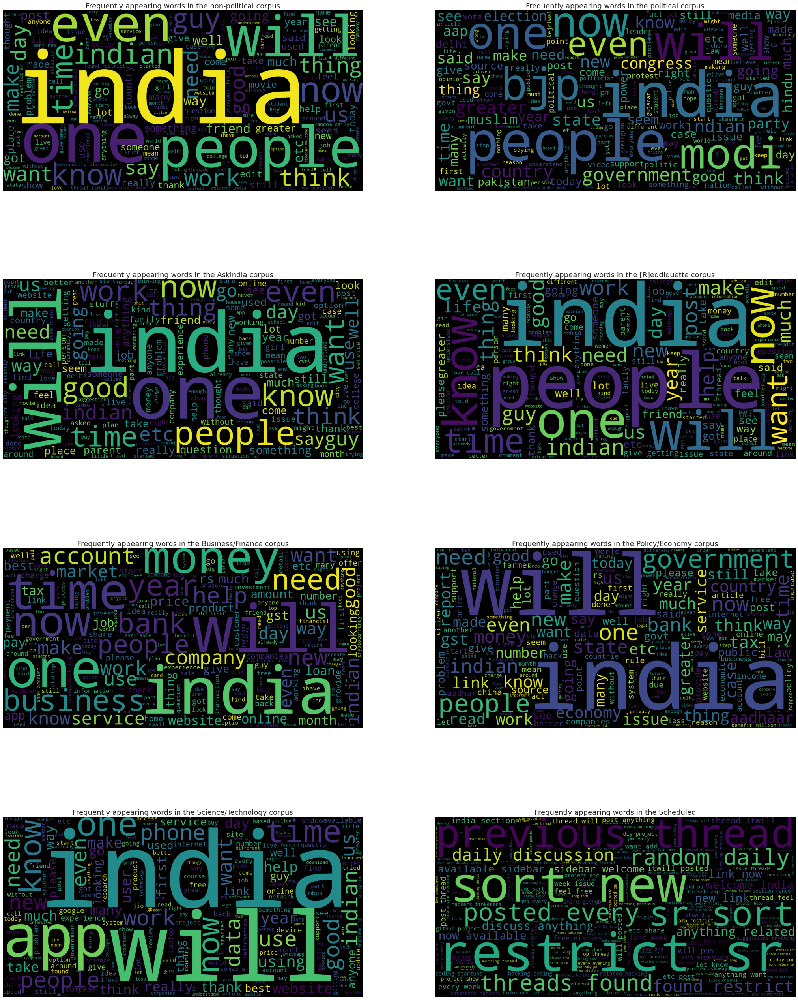

In [83]:
#@title
text=df[df['Flair']=='Non-Political'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.figure( figsize=(36,48))
plt.subplot(421)
plt.axis("off")
plt.title("Frequently appearing words in the non-political corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='Politics'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(422)
plt.axis("off")
plt.title("Frequently appearing words in the political corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='AskIndia'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(423)
plt.axis("off")
plt.title("Frequently appearing words in the AskIndia corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='[R]eddiquette'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(424)
plt.axis("off")
plt.title("Frequently appearing words in the [R]eddiquette corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='Business/Finance'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(425)
plt.axis("off")
plt.title("Frequently appearing words in the Business/Finance corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='Policy/Economy'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(426)
plt.axis("off")
plt.title("Frequently appearing words in the Policy/Economy corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='Science/Technology'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(427)
plt.axis("off")
plt.title("Frequently appearing words in the Science/Technology corpus", fontsize=18)
plt.imshow(wc)

text=df[df['Flair']=='Scheduled'].Text.values
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate(" ".join(text))
plt.subplot(428)
plt.axis("off")
plt.title("Frequently appearing words in the Scheduled", fontsize=18)
plt.imshow(wc)

plt.show()

In [0]:
from sklearn.feature_extraction.text import CountVectorizer as CV
from sklearn.feature_extraction.text import TfidfVectorizer as TF
from sklearn.naive_bayes import MultinomialNB as MNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.utils import resample
import numpy as np
from scipy.sparse import hstack
from scipy import sparse

In [0]:
#UNDERSAMPLE
f_df={k:df[df['Flair']==k] for k in set(df['Flair'])}
train_df=pd.concat([resample(data[100:], n_samples=22700, replace=True, random_state=123) for data in f_df.values()])
valid_df=pd.concat([data[:100] for data in f_df.values()])

In [0]:
cv=TF(sublinear_tf=True,min_df=10, encoding='latin-1',ngram_range=(1,1),stop_words='english', analyzer='word', max_features=6150)
cv.fit(df['Title']+' '+df['Text'])
train_data=hstack((cv.transform(train_df['Title']),cv.transform(train_df['Text'])))
valid_data=hstack((cv.transform(valid_df['Title']),cv.transform(valid_df['Text'])))

In [0]:
model= MNB()
model.fit(train_data, train_df['Flair'])
rep=classification_report(y_pred=model.predict(valid_data), y_true=valid_df['Flair'])
print(rep)
print(np.array([float(v) for v in ' '.join(rep.split('\n')[2:10]).split()[3::5]]).sum())

                    precision    recall  f1-score   support

          AskIndia       0.32      0.47      0.38       100
  Business/Finance       0.56      0.54      0.55       100
     Non-Political       0.29      0.24      0.26       100
    Policy/Economy       0.67      0.45      0.54       100
          Politics       0.53      0.76      0.63       100
         Scheduled       0.89      0.89      0.89       100
Science/Technology       0.51      0.50      0.50       100
     [R]eddiquette       0.23      0.15      0.18       100

          accuracy                           0.50       800
         macro avg       0.50      0.50      0.49       800
      weighted avg       0.50      0.50      0.49       800

3.93


In [0]:
word_probs_tit=dict()
word_probs_tex=dict()
flair_prob_tex=dict()
flair_prob_tit=dict()
for word, code in cv.vocabulary_.items():
  word_probs_tit[word]=(2**model.feature_log_prob_)[:, code]
  word_probs_tex[word]=(2**model.feature_log_prob_)[:, code+cv.max_features]
for ind, flair in enumerate(model.classes_):
  flair_prob_tex[flair]={word:word_probs_tex[word][ind] for word in word_probs_tex.keys()}
  flair_prob_tit[flair]={word:word_probs_tit[word][ind] for word in word_probs_tit.keys()}

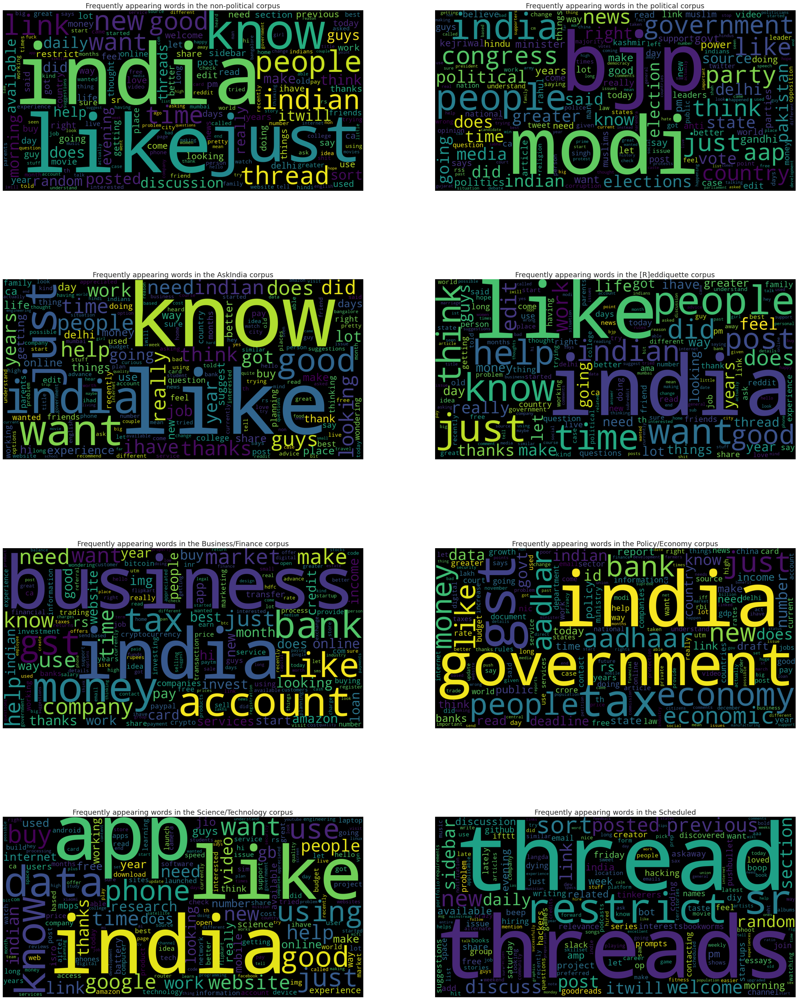

In [81]:
#@title
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Non-Political"])
plt.figure( figsize=(36,48))
plt.subplot(421)
plt.axis("off")
plt.title("Frequently appearing words in the non-political corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Politics"])
plt.subplot(422)
plt.axis("off")
plt.title("Frequently appearing words in the political corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["AskIndia"])
plt.subplot(423)
plt.axis("off")
plt.title("Frequently appearing words in the AskIndia corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["[R]eddiquette"])
plt.subplot(424)
plt.axis("off")
plt.title("Frequently appearing words in the [R]eddiquette corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Business/Finance"])
plt.subplot(425)
plt.axis("off")
plt.title("Frequently appearing words in the Business/Finance corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Policy/Economy"])
plt.subplot(426)
plt.axis("off")
plt.title("Frequently appearing words in the Policy/Economy corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Science/Technology"])
plt.subplot(427)
plt.axis("off")
plt.title("Frequently appearing words in the Science/Technology corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tex["Scheduled"])
plt.subplot(428)
plt.axis("off")
plt.title("Frequently appearing words in the Scheduled", fontsize=18)
plt.imshow(wc)

plt.show()

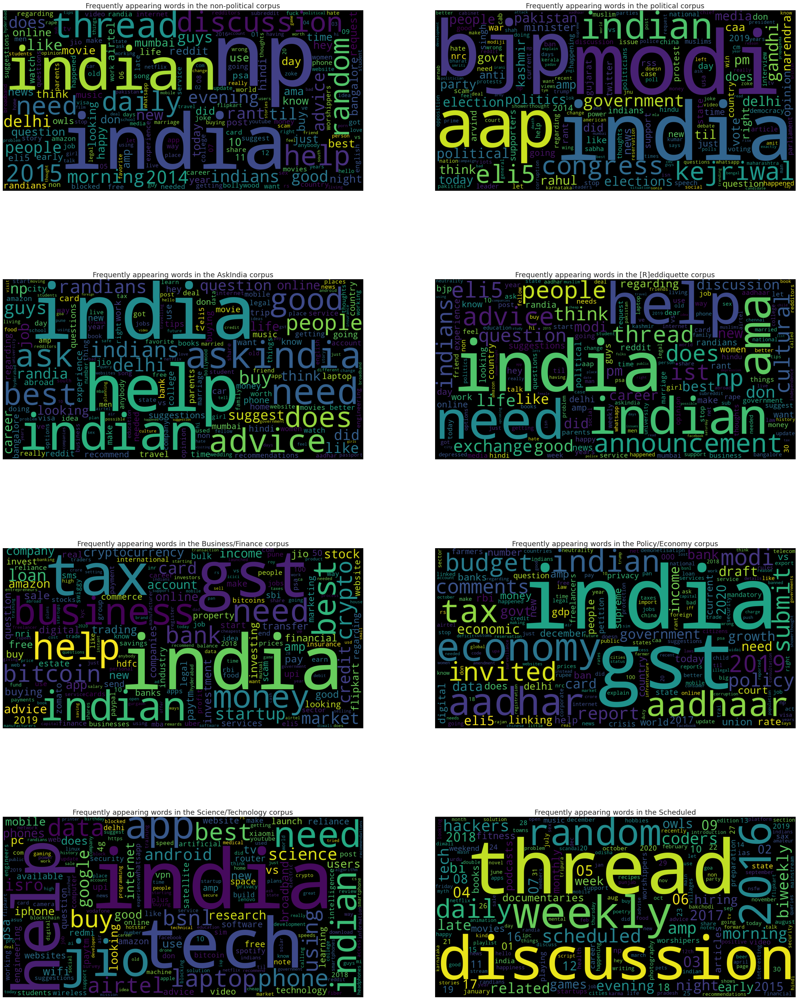

In [82]:
#@title
wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Non-Political"])
plt.figure( figsize=(36,48))
plt.subplot(421)
plt.axis("off")
plt.title("Frequently appearing words in the non-political corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Politics"])
plt.subplot(422)
plt.axis("off")
plt.title("Frequently appearing words in the political corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["AskIndia"])
plt.subplot(423)
plt.axis("off")
plt.title("Frequently appearing words in the AskIndia corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["[R]eddiquette"])
plt.subplot(424)
plt.axis("off")
plt.title("Frequently appearing words in the [R]eddiquette corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Business/Finance"])
plt.subplot(425)
plt.axis("off")
plt.title("Frequently appearing words in the Business/Finance corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Policy/Economy"])
plt.subplot(426)
plt.axis("off")
plt.title("Frequently appearing words in the Policy/Economy corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Science/Technology"])
plt.subplot(427)
plt.axis("off")
plt.title("Frequently appearing words in the Science/Technology corpus", fontsize=18)
plt.imshow(wc)

wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
wc.generate_from_frequencies(flair_prob_tit["Scheduled"])
plt.subplot(428)
plt.axis("off")
plt.title("Frequently appearing words in the Scheduled", fontsize=18)
plt.imshow(wc)

plt.show()